In [1]:
import sys
sys.path.insert(0, '../../src')
from proteusAI.ml_tools.esm_tools import *
import os
import pandas as pd
import torch
from scipy.stats import pearsonr
import re
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 16

# load alphabet
alphabet = alphabet.to_dict()

# models
models = ['esm1v', 'esm2']

# paths
script_path = os.path.dirname('.')
results_base_path = os.path.join(script_path, 'results')
plots_base_path = os.path.join(script_path, 'plots')
DMS_path = os.path.join(script_path, '../data/DMS_enzymes')
datasets_path = os.path.join(DMS_path, 'datasets')

# make base destinations
os.makedirs(results_base_path, exist_ok=True)
os.makedirs(plots_base_path, exist_ok=True)

In [2]:
def parse_substitution(substitution):
    match = re.match(r"([A-Za-z])(\d+)([A-Za-z])", substitution)
    if match:
        return match.groups()
    return None, None, None

def calculate_pearson(mmp: torch.Tensor, data: pd.DataFrame):
    # Create lists to store the mmp values of the substituted amino acids, the DMS scores, 
    # the positions and the types of the substituted amino acids
    mmp_values = []
    scores = []
    positions = []
    mutations = []
    wt_aas = []

    for index, row in data.iterrows():
        wildtype_aa, position, substitute_aa = parse_substitution(row["mutant"])
        if wildtype_aa and position and substitute_aa:
            position = int(position) - 1  # Convert to 0-indexed
            substitute_aa_index = alphabet[substitute_aa]  # Get the index of the substituted amino acid

            # Get the mmp value of the substituted amino acid
            mmp_value = mmp[0, position, substitute_aa_index].item()
            score = row["y"]
            
            mmp_values.append(mmp_value)
            scores.append(score)
            wt_aas.append(wildtype_aa)
            positions.append(position)
            mutations.append(substitute_aa)

    # Create a DataFrame with the gathered information
    df = pd.DataFrame({
        'WT': wt_aas,
        'Position': positions,
        'Mutation': mutations,
        'MMP': mmp_values,
        'Score': scores,
    })

    # Sort the DataFrame based on the DMS scores and take the top n entries
    top_mutations_df = df.sort_values('Score', ascending=False)
    
    # Calculate correlation between the mmp values of the substituted amino acids and the DMS scores
    pearson_corr, _ = pearsonr(mmp_values, scores)

    return pearson_corr, top_mutations_df

In [5]:
#read metadata
meta_data = pd.read_csv(os.path.join(DMS_path, "enzyme_metadata.csv"))

# extract names and sequences
seqs = meta_data['target_seq']
names = meta_data['DMS_id']

# Create DataFrame to store results
results_df = pd.DataFrame(index=names, columns=models)
top_mutations_data = []

# load datasets
datasets = [pd.read_csv(os.path.join(datasets_path, name + '.csv')) for name in names]

i = 0
# iterate through each model
for model in models:
    results_path = os.path.join(results_base_path, model)
    plots_path = os.path.join(plots_base_path, model)
    os.makedirs(results_path, exist_ok=True)
    os.makedirs(plots_path, exist_ok=True)

    # compute and plot
    for i, (name, seq) in enumerate(zip(names, seqs)):  # use enumerate to get index
        # create a folder for every gene
        dest = os.path.join(results_path, name)
        os.makedirs(dest, exist_ok=True)

        # create a folder for every gene
        plots_dest = os.path.join(plots_path, name)
        os.makedirs(plots_dest, exist_ok=True)

        study_data = datasets[i]

        p = torch.load(f'{results_path}/{name}/prob_dist.pt')
        mmp = torch.load(f'{results_path}/{name}/masked_marginal_probability.pt')
        entropy = torch.load(f'{results_path}/{name}/per_position_entropy.pt')

        pearson_corr, top_mutations_df = calculate_pearson(mmp, study_data)


        # Store results in DataFrame and the top mutation dataframe in the list
        results_df.loc[name, model] = pearson_corr
        top_mutations_data.append({
            'study': name,
            'model': model,
            'df': top_mutations_df
        })

# Print DataFrame as LaTeX table
print(results_df.to_latex(index=True))

\begin{tabular}{lll}
\toprule
{} &     esm1v &      esm2 \\
DMS\_id                             &           &           \\
\midrule
AMIE\_PSEAE\_Wrenbeck\_2017           &  0.581959 &  0.581959 \\
CCDB\_ECOLI\_Tripathi\_2016           &  0.413976 &  0.413976 \\
CP2C9\_HUMAN\_Amorosi\_abundance\_2021 &  0.590706 &  0.590706 \\
CP2C9\_HUMAN\_Amorosi\_activity\_2021  &  0.631831 &  0.631831 \\
MSH2\_HUMAN\_Jia\_2020                &  0.454211 &  0.454211 \\
PTEN\_HUMAN\_Mighell\_2018            &  0.514143 &  0.514143 \\
Q59976\_STRSQ\_Romero\_2015           &  0.522546 &  0.522547 \\
RL401\_YEAST\_Roscoe\_2014            &  0.259686 &  0.259686 \\
SRC\_HUMAN\_Ahler\_CD\_2019            &  0.472429 &   0.47243 \\
\bottomrule
\end{tabular}



/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/1638650717.py:51: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(results_df.to_latex(index=True))


In [6]:
from scipy.stats import pearsonr

def plot_effect_vs_correlation(data):
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot data with linear regression model fit
    sns.regplot(x='Score', y='MMP', data=data['df'], line_kws={"color": "red", "linewidth": 2.5, "linestyle": "--"})
    
    # Calculate Pearson correlation and R-squared
    pearson_corr, p_value = pearsonr(data['df']['Score'], data['df']['MMP'])
    r_squared = pearson_corr ** 2

    # Add text box with Pearson correlation and R-squared
    textstr = f'Pearson correlation: {pearson_corr:.2f}\nR-squared: {r_squared:.2f}'
    ax.text(0.02, 0.98, textstr, transform=ax.transAxes, fontsize=10, color='red',
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
    
    plt.title(f'Effect Size vs. Correlation for {data["study"]}, Model: {data["model"]}')
    plt.show()


In [7]:
# Initialize an empty dataframe to hold all data
all_data = pd.DataFrame()

# Gather all data into one dataframe
for data in top_mutations_data:
    df = data['df'].copy()  # Make a copy to avoid modifying the original data
    df['Study'] = data['study']
    df['Model'] = data['model']
    all_data = pd.concat([all_data, df])

# Rename columns for consistency
all_data = all_data.rename(columns={'Score': 'DMS Score (Actual Effect)', 'MMP': 'MMP (Predicted Effect)'})

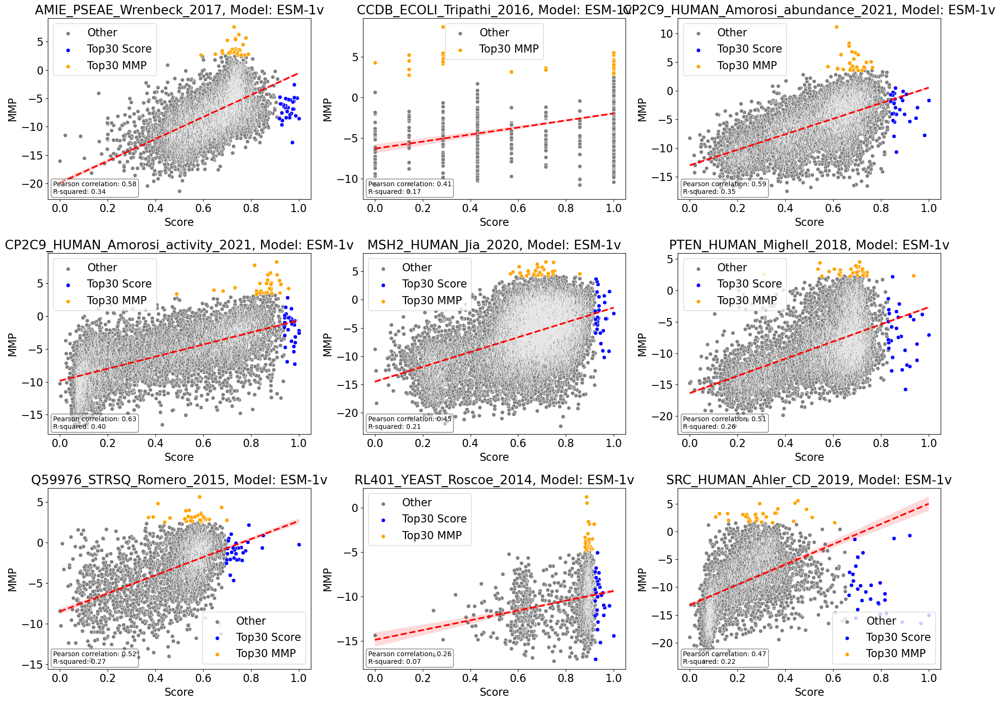

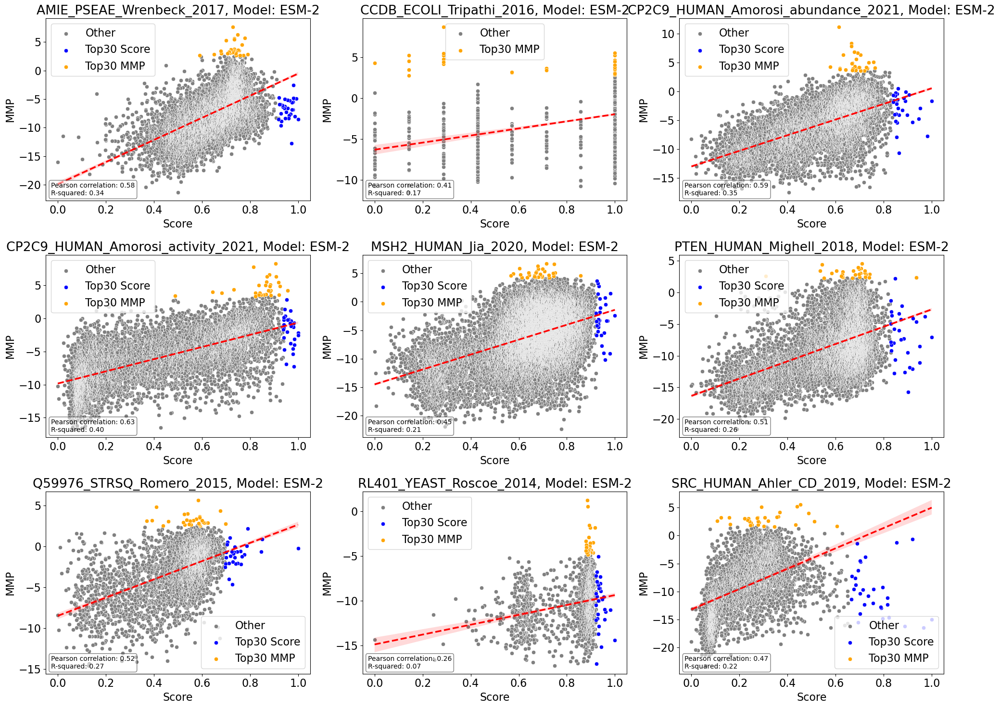

In [8]:
from scipy.stats import pearsonr

# Define maximum number of columns
max_cols = 3
top_n = 30

# Filter top_mutations_data by model
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]

    # Calculate the number of rows and columns for the grid
    num_plots = len(filtered_data)
    num_rows = num_plots // max_cols
    num_rows += num_plots % max_cols

    # Create the subplots
    fig, axes = plt.subplots(num_rows, max_cols, figsize=(20, num_rows*5))

    # Flatten the axes array, for simpler indexing
    axes = axes.flatten()

    # Create the scatter plots with linear regression model fit and correlation text
    for i, data in enumerate(filtered_data):
        ax = axes[i]

        # Highlight top 15 highest scoring mutations
        data['df'][f'Top{top_n}_Score'] = data['df']['Score'].rank(ascending=False) <= top_n
        data['df'][f'Top{top_n}_MMP'] = data['df']['MMP'].rank(ascending=False) <= top_n

        # Separate points based on their categories
        df_other = data['df'][~(data['df'][f'Top{top_n}_Score'] | data['df'][f'Top{top_n}_MMP'])]
        df_top_score = data['df'][data['df'][f'Top{top_n}_Score']]
        df_top_mmp = data['df'][data['df'][f'Top{top_n}_MMP']]

        # Plot points
        sns.scatterplot(x='Score', y='MMP', data=df_other, color='grey', label='Other', ax=ax)
        sns.scatterplot(x='Score', y='MMP', data=df_top_score, color='blue', label=f'Top{top_n} Score', ax=ax)
        sns.scatterplot(x='Score', y='MMP', data=df_top_mmp, color='orange', label=f'Top{top_n} MMP', ax=ax)
        sns.regplot(x='Score', y='MMP', data=data['df'], scatter=False, line_kws={"color": "red", "linewidth": 2.5, "linestyle": "--"}, ax=ax)

        # Calculate Pearson correlation and R-squared
        pearson_corr, p_value = pearsonr(data['df']['Score'], data['df']['MMP'])
        r_squared = pearson_corr ** 2

        # Add text box with Pearson correlation and R-squared
        textstr = f'Pearson correlation: {pearson_corr:.2f}\nR-squared: {r_squared:.2f}'
        ax.text(0.02, 0.02, textstr, transform=ax.transAxes, fontsize=10,
                 verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

        ax.set_title(f'{data["study"]}, Model: {model.replace("esm", "ESM-")}')

    # Remove the unused plots
    for idx in range(i+1, len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.savefig(f'results/zero_shot_vs_scores_{model}.png')
    plt.show()


/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  hue_order = plot.get_legend().legendHandles
/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  hue_order = plot.get_legend().legendHandles
/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  hue_order = plot.get_legend().legendHandles
/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The l

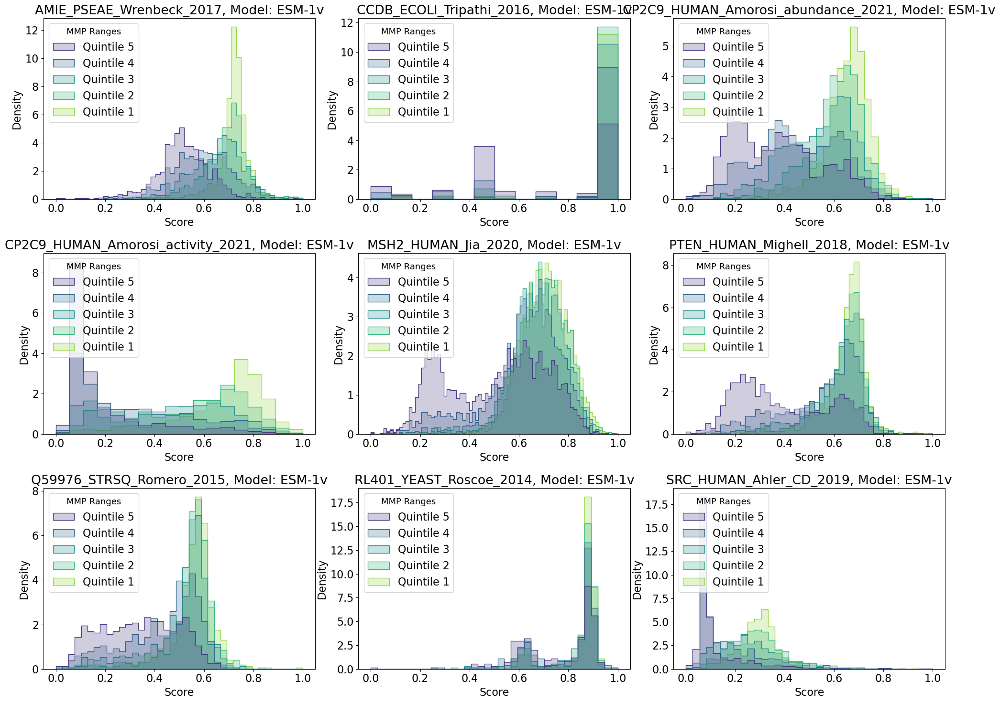

/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  hue_order = plot.get_legend().legendHandles
/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  hue_order = plot.get_legend().legendHandles
/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  hue_order = plot.get_legend().legendHandles
/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_86966/2597558450.py:38: MatplotlibDeprecationWarning: The l

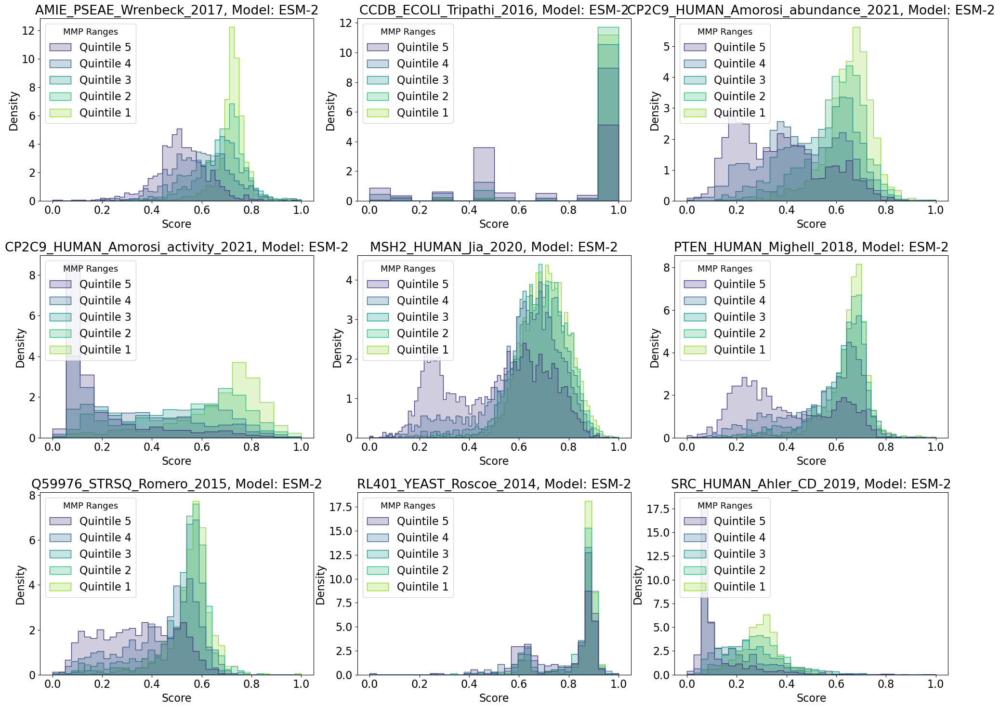

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# Define maximum number of columns
max_cols = 3
top_n = 30

# Filter top_mutations_data by model
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]

    # Calculate the number of rows and columns for the grid
    num_plots = len(filtered_data)
    num_rows = num_plots // max_cols
    num_rows += num_plots % max_cols

    # Create the subplots
    fig, axes = plt.subplots(num_rows, max_cols, figsize=(20, num_rows*5))

    # Flatten the axes array, for simpler indexing
    axes = axes.flatten()

    for i, data in enumerate(filtered_data):
        ax = axes[i]
        
        # Bin 'MMP' into ranges, reversing the order of the quintiles
        data['df']['MMP_Range'] = pd.qcut(data['df']['MMP'], q=5, labels=['Quintile 5', 'Quintile 4', 'Quintile 3', 'Quintile 2', 'Quintile 1'])
        
        # Create a histogram or KDE plot for 'Score' for each 'MMP' range
        plot = sns.histplot(data=data['df'], x='Score', hue='MMP_Range', element="step", stat="density", common_norm=False, ax=ax, palette='viridis')
        
        ax.set_title(f'{data["study"]}, Model: {model.replace("esm", "ESM-")}')
        
        # Create a manual legend
        hue_order = plot.get_legend().legendHandles
        legend_labels = plot.get_legend().texts
        ax.legend(handles=hue_order, labels=[t.get_text() for t in legend_labels], title='MMP Ranges', title_fontsize='13', loc='upper left')

    # Remove the unused plots
    for idx in range(i+1, len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.savefig(f'results/zero_shot_vs_hists_{model}.png')
    plt.show()


# Sampling and library design

In [10]:
def sample_variants(df: pd.DataFrame, temperature: float, num_samples: int):
    """
    Sample variants from the dataframe based on the MMP values. 
    The temperature controls the randomness of the sampling.
    A high temperature results in more randomness, while a low temperature results in less randomness.
    """
    # Shift all MMP values to be positive
    min_mmp = df['MMP'].min()
    if min_mmp < 0:
        df['MMP'] = df['MMP'] - min_mmp

    # Take the exponent of the MMP divided by the temperature
    mmp_prob = np.exp(df['MMP'] / temperature)

    # Normalize the probabilities
    mmp_prob = mmp_prob / mmp_prob.sum()

    # Draw samples
    samples = np.random.choice(df.index, size=num_samples, p=mmp_prob)

    return df.loc[samples]


In [11]:
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]
    # Create the scatter plots with linear regression model fit and correlation text
    for i, data in enumerate(filtered_data):
        high_randomness_samples = sample_variants(data['df'], temperature=10.0, num_samples=1000)
        high_bias_samples = sample_variants(data['df'], temperature=0.1, num_samples=1000)
        print(high_randomness_samples['Score'].mean())
        print(high_bias_samples['Score'].mean())
        break
    break


0.662602030359316
0.7275347466854546


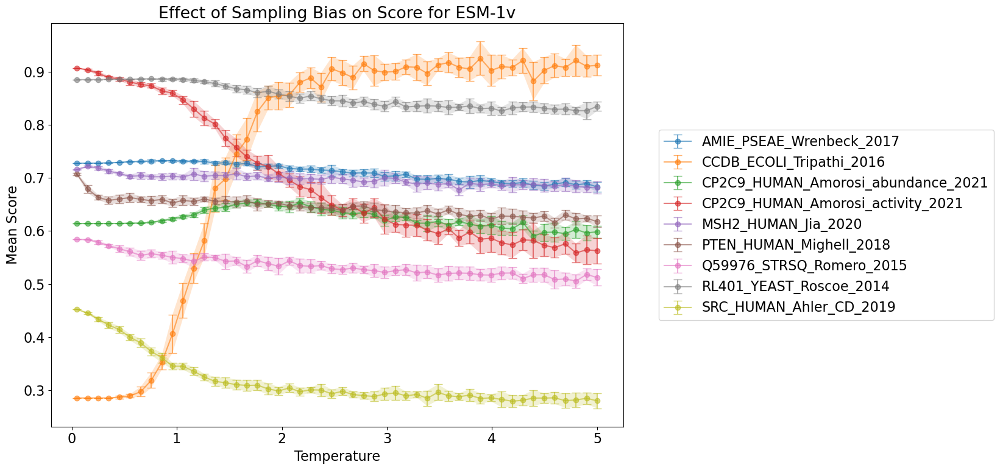

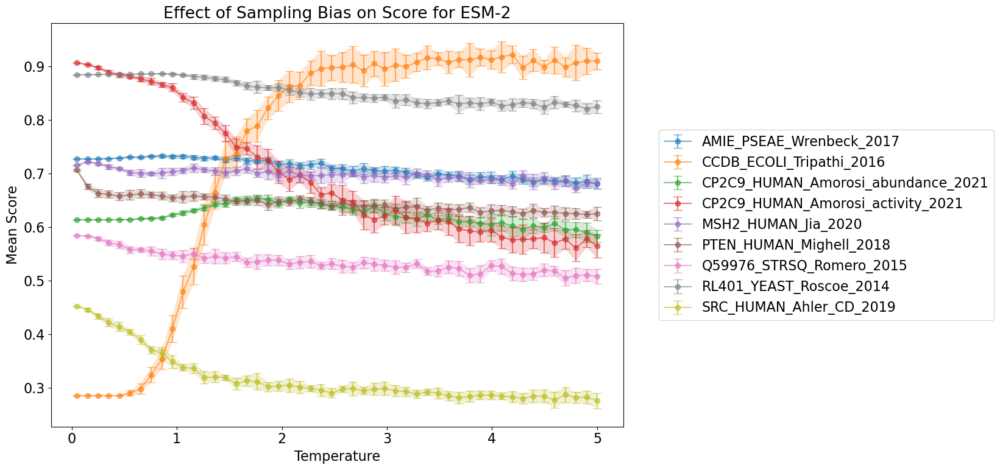

In [12]:
def plot_sampling_bias_effect(ax, study, temperatures, num_samples=100, num_iterations=10):
    """
    Plot the mean score and standard error for different temperatures.
    Each temperature is sampled num_iterations times and the mean and standard error are calculated.
    """
    mean_scores = []
    score_errors = []
    study_data = study['df']

    for temp in temperatures:
        temp_scores = []

        for _ in range(num_iterations):
            sampled_variants = sample_variants(study_data, temperature=temp, num_samples=num_samples)
            temp_scores.append(sampled_variants['Score'].mean())
        
        mean_scores.append(np.mean(temp_scores))
        score_errors.append(np.std(temp_scores))

    ax.errorbar(temperatures, mean_scores, yerr=score_errors, fmt='-o', capsize=5, alpha=0.6, label=study['study'])
    ax.fill_between(temperatures, np.subtract(mean_scores, score_errors), np.add(mean_scores, score_errors), alpha=0.2)

# Split the data into two groups based on the model
esm1v_data = [data for data in top_mutations_data if data["model"] == "esm1v"]
esm2_data = [data for data in top_mutations_data if data["model"] == "esm2"]

# Generate a range of temperatures
temperatures = np.linspace(0.05, 5, 50)  

# Plot the effect of sampling bias on score for each model
for i, (data, title) in enumerate(zip([esm1v_data, esm2_data], ["ESM-1v", "ESM-2"])):
    fig, ax = plt.subplots(figsize=(20, 8))
    for study in data:
        plot_sampling_bias_effect(ax, study, temperatures)
    ax.set_title(f'Effect of Sampling Bias on Score for {title}')
    ax.set_xlabel('Temperature')
    ax.set_ylabel('Mean Score')
    ax.legend(bbox_to_anchor=(1.05, 0.5), loc='center left')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.savefig(f'results/effect_of_temp_sampling_{title}.png', bbox_inches='tight')
    plt.show()
    plt.close(fig)  # Close the figure


In [13]:
study

{'study': 'SRC_HUMAN_Ahler_CD_2019',
 'model': 'esm2',
 'df':      WT  Position Mutation        MMP     Score  Top30_Score  Top30_MMP  \
 187   W       284        T   8.195945  1.000000         True      False   
 1519  E       380        R   6.722746  0.965740         True      False   
 33    V       273        G  22.554389  0.920388         True      False   
 1524  E       380        M   7.032732  0.888448         True      False   
 26    E       272        G  21.986819  0.853787         True      False   
 ...  ..       ...      ...        ...       ...          ...        ...   
 1805  V       404        K   6.389400  0.019029        False      False   
 1625  D       388        I   2.754715  0.017799        False      False   
 1667  N       393        H  10.031559  0.016169        False      False   
 1889  A       410        N  10.056072  0.004019        False      False   
 2135  P       427        Y   4.280533  0.000000        False      False   
 
        MMP_Range  
 187 

KeyboardInterrupt: 

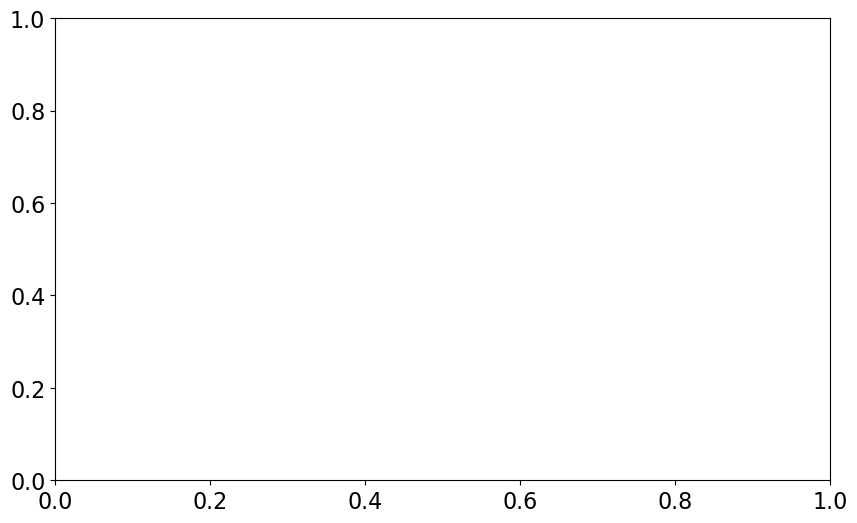

In [16]:
def compute_percent_variant_sampled(studies_data, num_samples, percent=1):
    sampled_top_percent = []
    for d in studies_data:
        df = d['df']
        top_percent_count = int(len(df) * percent/100)  # Top 1% count
        sorted_df = df.sort_values(by=['Score'], ascending=False)
        top_percent_variants = sorted_df.iloc[:top_percent_count]  # Top percent variants
        sampled_variants = sorted_df.sample(num_samples)  # Sampled variants
        top_percent_sampled = len(set(top_percent_variants.index) & set(sampled_variants.index))
        sampled_top_percent.append(top_percent_sampled / top_percent_count * 100)
    return np.mean(sampled_top_percent)


def plot_average_bias_effect(ax, studies_data, temperatures, num_samples=1000, num_iterations=1000):
    mean_scores = []
    mean_score_errors = []
    best_scores = 0
    optimal_temperature = 0
    
    percent_sampled_values = []
    
    for temp in temperatures:
        temp_scores = []
        percent_sampled = []

        for data in studies_data:
            for _ in range(num_iterations):
                sampled_variants = sample_variants(data['df'], temperature=temp, num_samples=num_samples)
                temp_scores.append(sampled_variants['Score'].mean())
                percent_sampled.append(compute_percent_variant_sampled([data], num_samples))

        temp_score = np.mean(temp_scores)
        mean_scores.append(temp_score)
        percent_sampled_values.append(np.mean(percent_sampled))
        if temp_score > best_scores:
            optimal_temperature = temp
            best_scores = temp_score
            
    mean_score_errors.append(np.std(mean_scores))
    
    average_top_scores = compute_average_top_scores(studies_data)
    ax.axhline(average_top_scores, color='grey', linestyle='--')
    
    ax.errorbar(temperatures, mean_scores, yerr=mean_score_errors, fmt='-o', capsize=5, alpha=0.6)
    ax.fill_between(temperatures, np.subtract(mean_scores, mean_score_errors), np.add(mean_scores, mean_score_errors), alpha=0.2)
    ax.axvline(optimal_temperature, color='red', linestyle='--')

    ax.set_title('Effect of Sampling Bias on Mean Score')
    ax.set_xlabel('Temperature')
    ax.set_ylabel('Mean Score')
    
    ax2 = ax.twinx()  # Create a second axes that shares the same x-axis
    ax2.plot(temperatures, percent_sampled_values, '-o', color='green', alpha=0.6)
    ax2.set_ylabel('Percentage of Top 1% Variants Sampled', color='green')
    ax2.tick_params(axis='y', labelcolor='green')

    fig.tight_layout()  # Make sure the right y-label is not cut off
    print('Optimal temperature:', optimal_temperature)

# Create a new figure
fig, ax = plt.subplots(figsize=(10, 6))

# Call the function
plot_average_bias_effect(ax, top_mutations_data, temperatures)

# Show the plot
plt.savefig('results/optimal_sampling_temperature.png')
plt.show()


Optimal temperature: 0.05


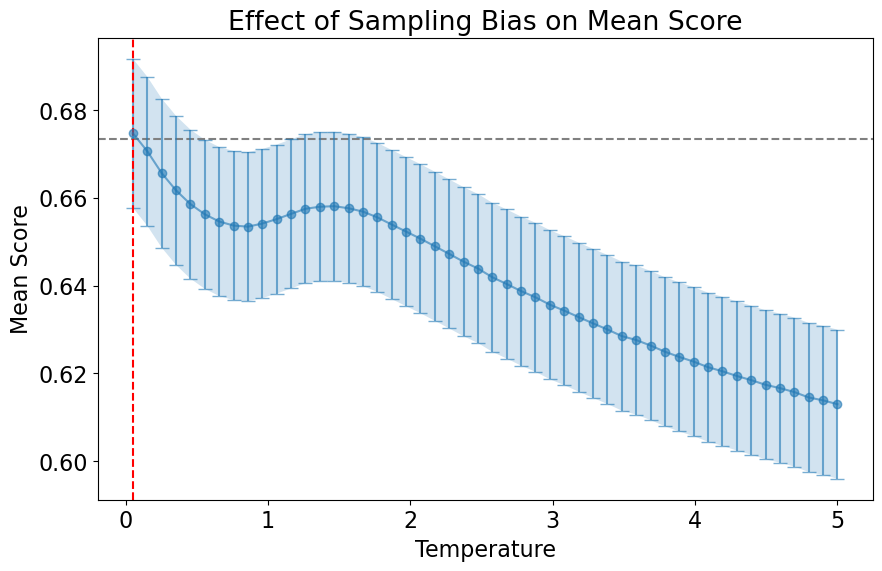

In [259]:
# Create a new figure
fig, ax = plt.subplots(figsize=(10, 6))

# Excluding CCDB study
plot_average_bias_effect(ax, top_mutations_data[0:1] + top_mutations_data[2:], temperatures)

# Show the plot
plt.savefig('results/optimal_sampling_temperature_without_outlier.png')
plt.show()

In [242]:
metadata = pd.read_csv(os.path.join(DMS_path, 'enzyme_metadata.csv'))

In [253]:

print(metadata[['DMS_id', 'seq_len']].to_latex(index=True))

\begin{tabular}{llr}
\toprule
{} &                              DMS\_id &  seq\_len \\
\midrule
0 &            AMIE\_PSEAE\_Wrenbeck\_2017 &      346 \\
1 &            CCDB\_ECOLI\_Tripathi\_2016 &      101 \\
2 &  CP2C9\_HUMAN\_Amorosi\_abundance\_2021 &      490 \\
3 &   CP2C9\_HUMAN\_Amorosi\_activity\_2021 &      490 \\
4 &                 MSH2\_HUMAN\_Jia\_2020 &      934 \\
5 &             PTEN\_HUMAN\_Mighell\_2018 &      403 \\
6 &            Q59976\_STRSQ\_Romero\_2015 &      501 \\
7 &             RL401\_YEAST\_Roscoe\_2014 &      128 \\
8 &             SRC\_HUMAN\_Ahler\_CD\_2019 &      536 \\
\bottomrule
\end{tabular}



/var/folders/sd/pr3fylj57wlgrmcxg1v4zp3c0000gn/T/ipykernel_56982/752744230.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(metadata[['DMS_id', 'seq_len']].to_latex(index=True))


In [17]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

def percentage_sampled(X, Y, N, dataset):
    mmp_top = dataset.nlargest(int(len(dataset) * Y), 'MMP')
    mmp_top_x = mmp_top.nlargest(int(len(mmp_top) * X), 'MMP') 
    
    #assert len(mmp_top_x) < 5000
    
    score_top = dataset.nlargest(N, 'Score')
    intersection = pd.merge(score_top, mmp_top_x, how='inner')
    
    return len(intersection) / N * 100

def percentage_sampled_random(X, Y, N, dataset):
    
    sampled = dataset.sample(int(len(mmp_top) * X), 'MMP') 
    
    #assert len(mmp_top_x) < 5000
    
    score_top = dataset.nlargest(N, 'Score')
    intersection = pd.merge(score_top, sampled, how='inner')
    
    return len(intersection) / N * 100

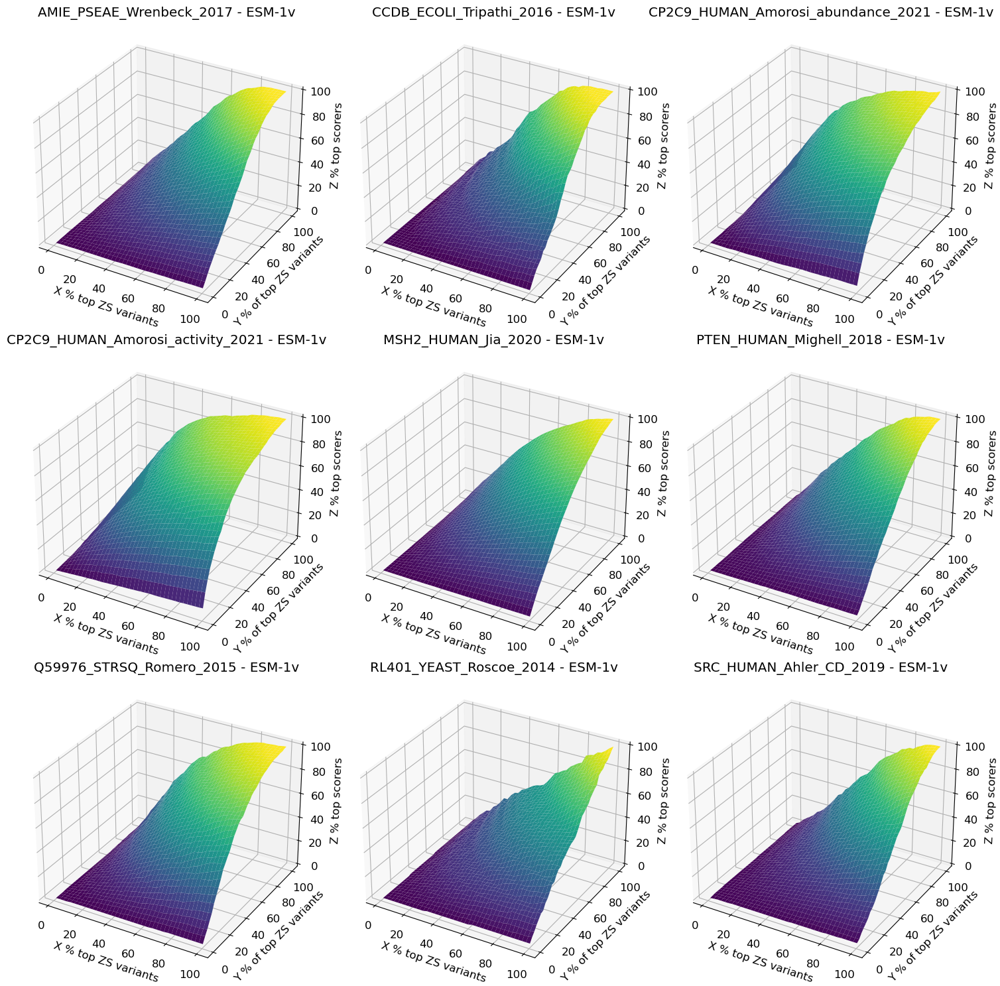

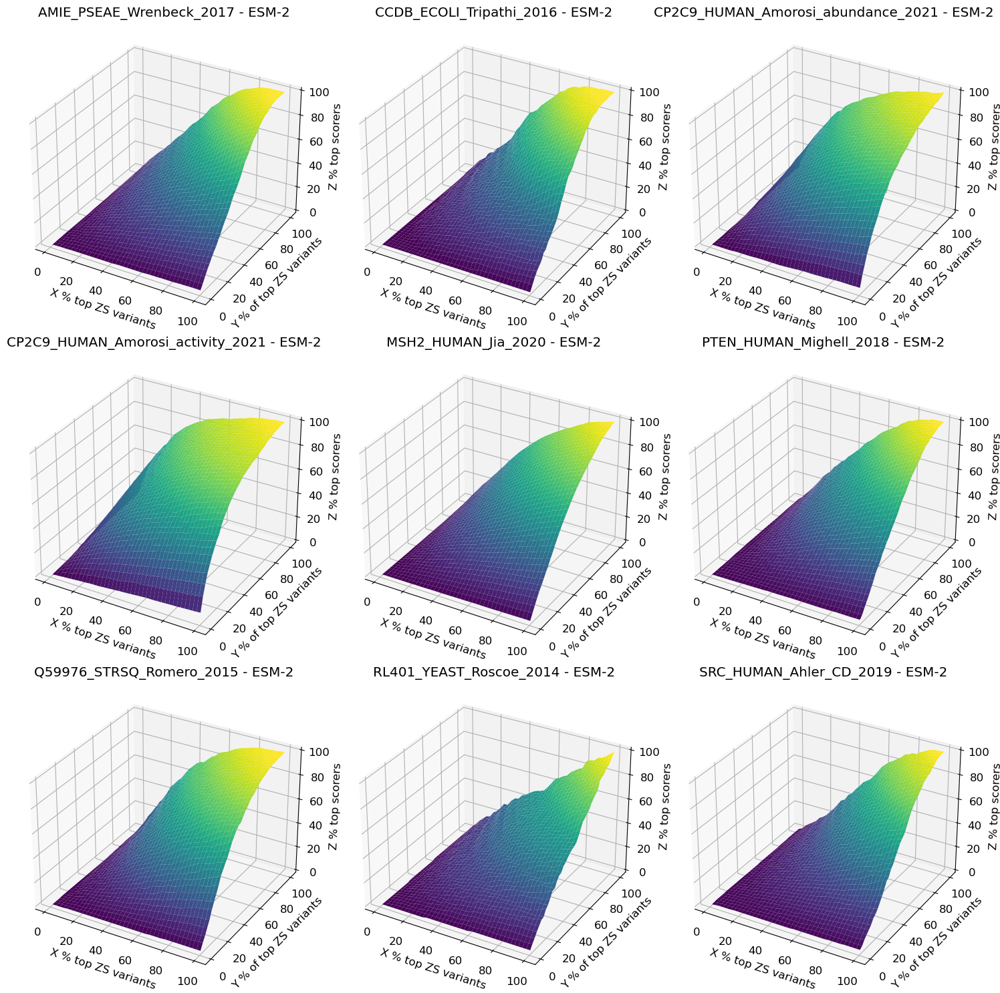

In [18]:
plt.rcParams['font.size'] = 12

# Define maximum number of columns
max_cols = 3

# Define ranges and parameters
X_range = np.linspace(1, 100, 40)  # Adjust as needed
Y_range = np.linspace(1, 100, 40)  # Adjust as needed
N_percent = 10

# Filter top_mutations_data by model
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]

    # Calculate the number of rows and columns for the grid
    num_plots = len(filtered_data)
    num_rows = num_plots // max_cols
    num_rows += num_plots % max_cols

    # Create the subplots
    fig = plt.figure(figsize=(max_cols*5, num_rows*5))
    axes = [fig.add_subplot(num_rows, max_cols, i+1, projection='3d') for i in range(num_plots)]

    # Iterate over datasets
    for i, data in enumerate(filtered_data):
        N = int(len(data['df'])* (N_percent/100))
        ax = axes[i]

        # Initialize Z array
        Z = np.empty((len(Y_range), len(X_range)))

        # Iterate over X and Y ranges and calculate Z
        for i_Y, Y in enumerate(Y_range):
            for i_X, X in enumerate(X_range):
                Z[i_Y, i_X] = percentage_sampled(X/100, Y/100, N, data['df'])  # the function expects percentages as decimals

        # Create the meshgrid for X, Y, and plot
        X_mesh, Y_mesh = np.meshgrid(X_range, Y_range)
        surface = ax.plot_surface(X_mesh, Y_mesh, Z, cmap='viridis')

        # Draw a contour at Z=50
        #ax.contour(X_mesh, Y_mesh, Z, levels=[50], colors='r', linewidths=3)

        ax.set_title(f'{data["study"]} - {model.replace("esm", "ESM-")}')
        ax.set_xlabel('X % top ZS variants')
        ax.set_ylabel('Y % of top ZS variants')
        ax.set_zlabel('Z % top scorers')

    plt.tight_layout()
    plt.savefig(f'results/surface_plot_{model}.png')
    plt.show()


AMIE_PSEAE_Wrenbeck_2017 - ESM-1v
Z = 0.0 + 0.18*X + 0.18*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
CCDB_ECOLI_Tripathi_2016 - ESM-1v
Z = 0.0 + 0.13*X + 0.13*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
CP2C9_HUMAN_Amorosi_abundance_2021 - ESM-1v
Z = 0.0 + 0.89*X + 0.89*Y + -0.01*X^2 + 0.01*Y^2 + -0.01*XY
CP2C9_HUMAN_Amorosi_activity_2021 - ESM-1v
Z = 0.0 + 1.08*X + 1.08*Y + -0.01*X^2 + 0.01*Y^2 + -0.01*XY
MSH2_HUMAN_Jia_2020 - ESM-1v
Z = 0.0 + 0.36*X + 0.36*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
PTEN_HUMAN_Mighell_2018 - ESM-1v
Z = 0.0 + 0.25*X + 0.25*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
Q59976_STRSQ_Romero_2015 - ESM-1v
Z = 0.0 + 0.65*X + 0.65*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
RL401_YEAST_Roscoe_2014 - ESM-1v
Z = 0.0 + 0.11*X + 0.11*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
SRC_HUMAN_Ahler_CD_2019 - ESM-1v
Z = 0.0 + -0.03*X + -0.03*Y + 0.0*X^2 + 0.01*Y^2 + 0.0*XY


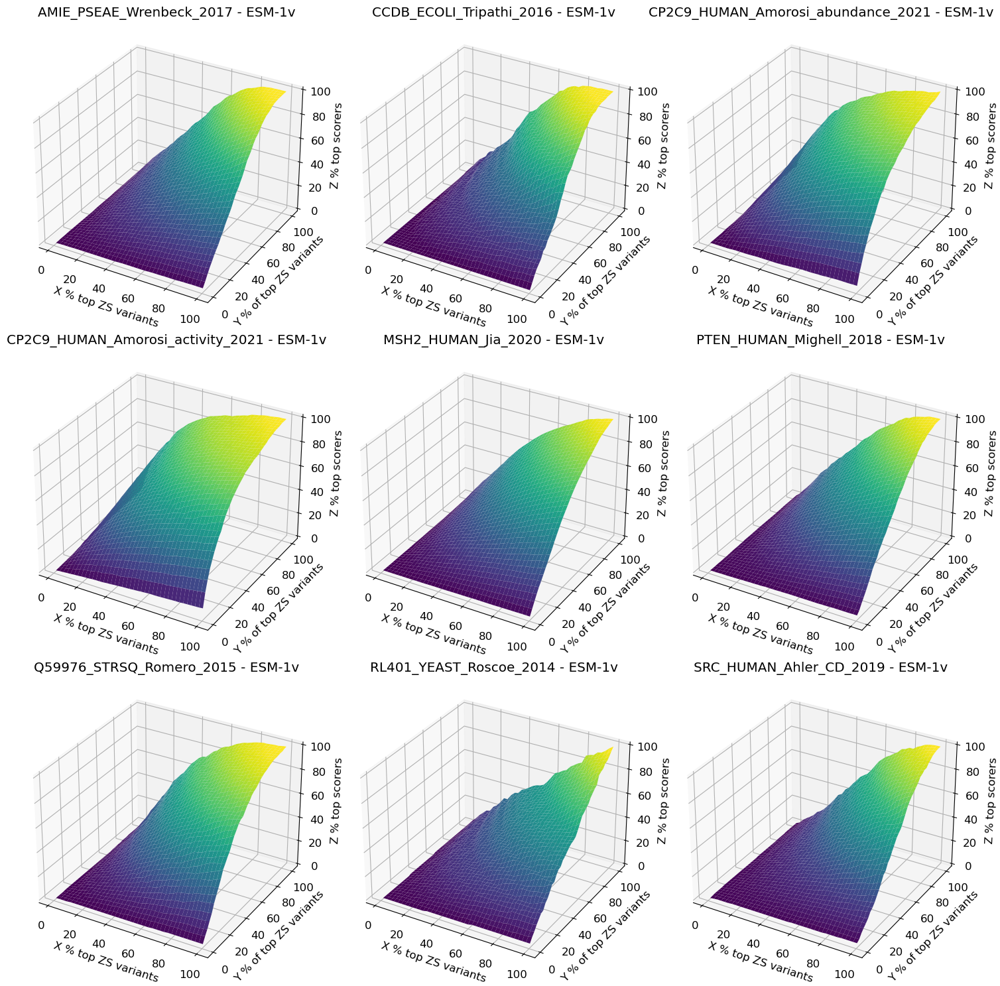

AMIE_PSEAE_Wrenbeck_2017 - ESM-2
Z = 0.0 + 0.18*X + 0.18*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
CCDB_ECOLI_Tripathi_2016 - ESM-2
Z = 0.0 + 0.13*X + 0.13*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
CP2C9_HUMAN_Amorosi_abundance_2021 - ESM-2
Z = 0.0 + 0.89*X + 0.89*Y + -0.01*X^2 + 0.01*Y^2 + -0.01*XY
CP2C9_HUMAN_Amorosi_activity_2021 - ESM-2
Z = 0.0 + 1.08*X + 1.08*Y + -0.01*X^2 + 0.01*Y^2 + -0.01*XY
MSH2_HUMAN_Jia_2020 - ESM-2
Z = 0.0 + 0.36*X + 0.36*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
PTEN_HUMAN_Mighell_2018 - ESM-2
Z = 0.0 + 0.25*X + 0.25*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
Q59976_STRSQ_Romero_2015 - ESM-2
Z = 0.0 + 0.65*X + 0.65*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
RL401_YEAST_Roscoe_2014 - ESM-2
Z = 0.0 + 0.11*X + 0.11*Y + -0.0*X^2 + 0.01*Y^2 + -0.0*XY
SRC_HUMAN_Ahler_CD_2019 - ESM-2
Z = 0.0 + -0.03*X + -0.03*Y + 0.0*X^2 + 0.01*Y^2 + 0.0*XY


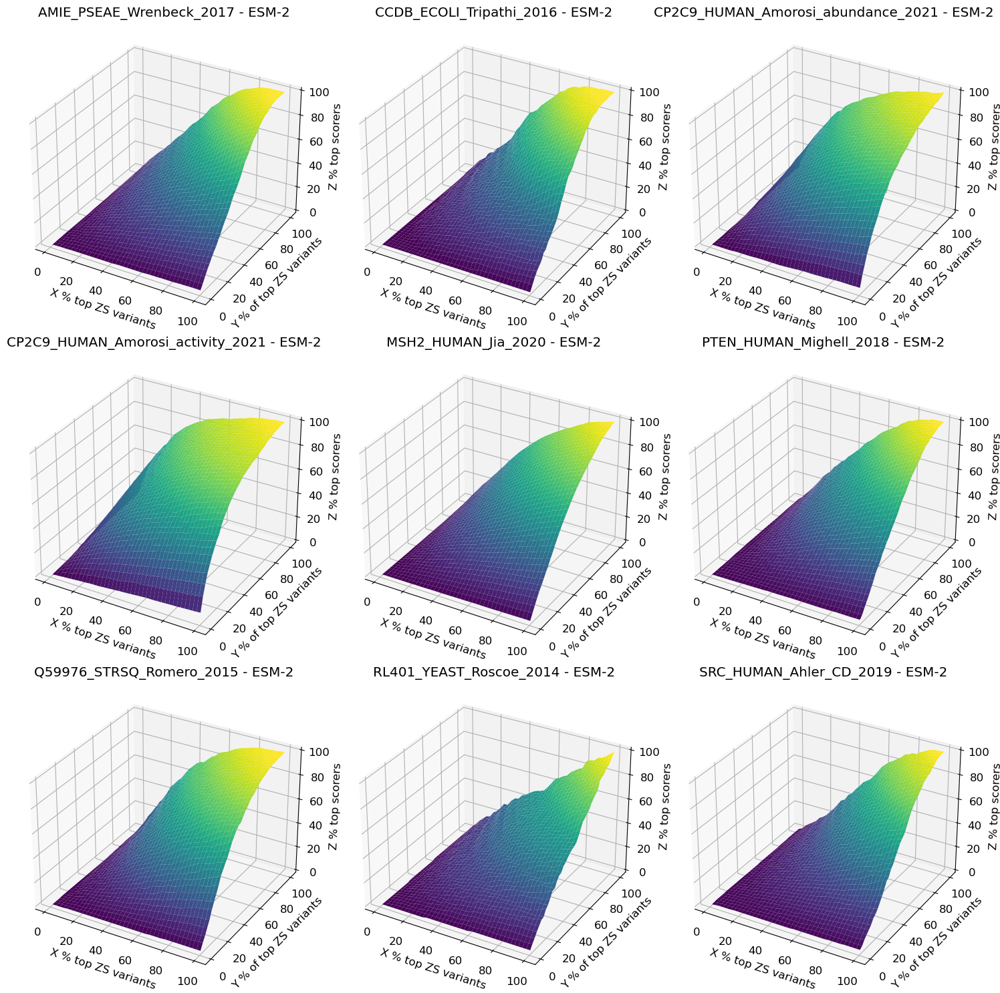

In [21]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

plt.rcParams['font.size'] = 12

# Define maximum number of columns
max_cols = 3

# Define ranges and parameters
X_range = np.linspace(1, 100, 40)  # Adjust as needed
Y_range = np.linspace(1, 100, 40)  # Adjust as needed
N_percent = 10

# Filter top_mutations_data by model
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]

    # Calculate the number of rows and columns for the grid
    num_plots = len(filtered_data)
    num_rows = num_plots // max_cols
    num_rows += num_plots % max_cols

    # Create the subplots
    fig = plt.figure(figsize=(max_cols*5, num_rows*5))
    axes = [fig.add_subplot(num_rows, max_cols, i+1, projection='3d') for i in range(num_plots)]

    # Iterate over datasets
    for i, data in enumerate(filtered_data):
        N = int(len(data['df'])* (N_percent/100))
        ax = axes[i]

        # Initialize Z array
        Z = np.empty((len(Y_range), len(X_range)))

        # Iterate over X and Y ranges and calculate Z
        for i_Y, Y in enumerate(Y_range):
            for i_X, X in enumerate(X_range):
                Z[i_Y, i_X] = percentage_sampled(X/100, Y/100, N, data['df'])  # the function expects percentages as decimals

        # Create the meshgrid for X, Y, and plot
        X_mesh, Y_mesh = np.meshgrid(X_range, Y_range)
        surface = ax.plot_surface(X_mesh, Y_mesh, Z, cmap='viridis')

        # Fit a polynomial of degree 2 to the data
        degree = 2
        polyreg = make_pipeline(PolynomialFeatures(degree), LinearRegression())
        XY_values = np.vstack([X_mesh.ravel(), Y_mesh.ravel()]).T
        polyreg.fit(XY_values, Z.ravel())

        # Print the coefficients in the plot title
        coeffs = polyreg.named_steps['linearregression'].coef_
        ax.set_title(f'{data["study"]} - {model.replace("esm", "ESM-")}')
        print(f'{data["study"]} - {model.replace("esm", "ESM-")}')
        print(f'Z = {round(coeffs[0],2)} + {round(coeffs[1],2)}*X + {round(coeffs[2],2)}*Y + {round(coeffs[3],2)}*X^2 + {round(coeffs[4],2)}*Y^2 + {round(coeffs[5],2)}*XY')

        ax.set_xlabel('X % top ZS variants')
        ax.set_ylabel('Y % of top ZS variants')
        ax.set_zlabel('Z % top scorers')

    plt.tight_layout()
    plt.savefig(f'results/surface_plot_{model}.png')
    plt.show()


# Fitting a polynomial to a single study

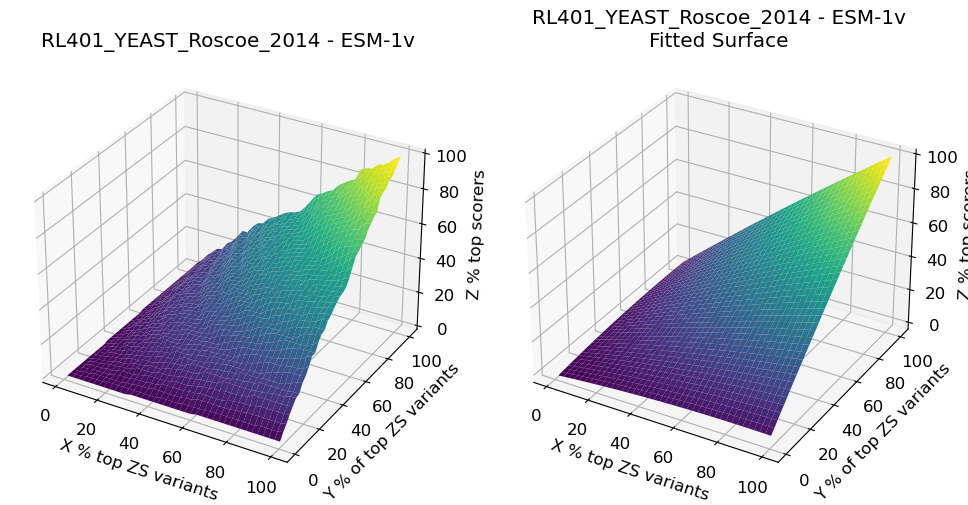

In [26]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

plt.rcParams['font.size'] = 12

# Define ranges and parameters
X_range = np.linspace(1, 100, 40)  # Adjust as needed
Y_range = np.linspace(1, 100, 40)  # Adjust as needed
N_percent = 10

# Filter top_mutations_data by model and study
model = 'esm1v'
study = 'RL401_YEAST_Roscoe_2014'  # replace with your study name
filtered_data = [data for data in top_mutations_data if data['model'] == model and data['study'] == study]

# Create the subplots
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

# Process the data
data = filtered_data[0]  # since you're only interested in a single study
N = int(len(data['df'])* (N_percent/100))

# Initialize Z array
Z = np.empty((len(Y_range), len(X_range)))

# Iterate over X and Y ranges and calculate Z
for i_Y, Y in enumerate(Y_range):
    for i_X, X in enumerate(X_range):
        Z[i_Y, i_X] = percentage_sampled(X/100, Y/100, N, data['df'])  # the function expects percentages as decimals

# Create the meshgrid for X, Y, and plot the original data
X_mesh, Y_mesh = np.meshgrid(X_range, Y_range)
surface = ax1.plot_surface(X_mesh, Y_mesh, Z, cmap='viridis')
ax1.set_title(f'{data["study"]} - {model.replace("esm", "ESM-")}')
ax1.set_xlabel('X % top ZS variants')
ax1.set_ylabel('Y % of top ZS variants')
ax1.set_zlabel('Z % top scorers')

# Fit a polynomial of degree 2 to the data
degree = 2
polyreg = make_pipeline(PolynomialFeatures(degree), LinearRegression())
XY_values = np.vstack([X_mesh.ravel(), Y_mesh.ravel()]).T
polyreg.fit(XY_values, Z.ravel())

# Calculate the fitted Z values and plot
Z_fit = polyreg.predict(XY_values).reshape(X_mesh.shape)
surface_fit = ax2.plot_surface(X_mesh, Y_mesh, Z_fit, cmap='viridis')
ax2.set_title(f'{data["study"]} - {model.replace("esm", "ESM-")}\nFitted Surface')
ax2.set_xlabel('X % top ZS variants')
ax2.set_ylabel('Y % of top ZS variants')
ax2.set_zlabel('Z % top scorers')

plt.tight_layout()
plt.savefig(f'results/surface_plot_{model}_{study}.png')
plt.show()


# Fitting a single polynomial to all studies

(-1.05e+01) + (4.03e-01) * X + (4.03e-01) * Y + (-2.66e-03) * X^2 + (9.89e-03) * X*Y + (-2.66e-03) * Y^2


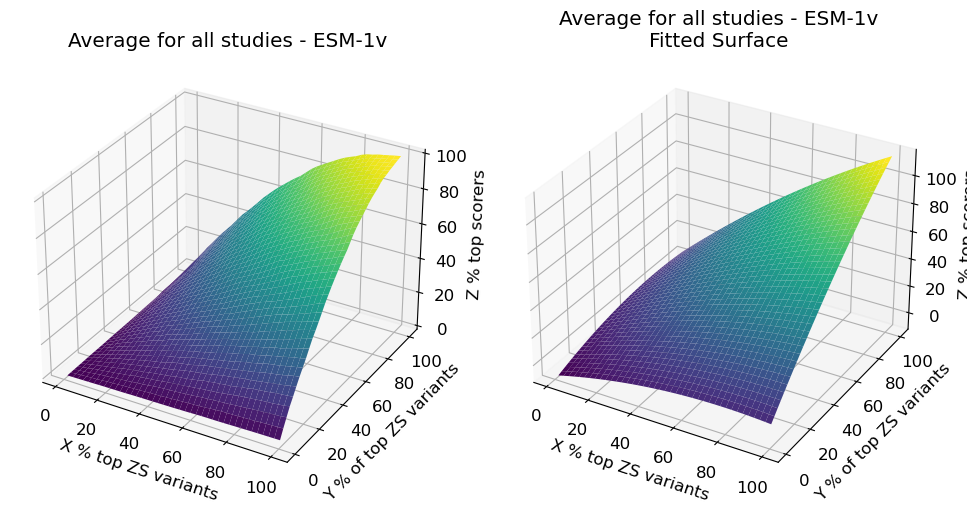

In [31]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

plt.rcParams['font.size'] = 12

# Define ranges and parameters
X_range = np.linspace(1, 100, 40)  # Adjust as needed
Y_range = np.linspace(1, 100, 40)  # Adjust as needed
N_percent = 10

# Filter top_mutations_data by model
model_name = 'esm1v'
filtered_data = [data for data in top_mutations_data if data['model'] == model_name]

# Initialize Z array
Z_all = np.empty((len(Y_range), len(X_range), len(filtered_data)))

# Iterate over datasets
for i, data in enumerate(filtered_data):
    N = int(len(data['df'])* (N_percent/100))

    # Iterate over X and Y ranges and calculate Z
    for i_Y, Y in enumerate(Y_range):
        for i_X, X in enumerate(X_range):
            Z_all[i_Y, i_X, i] = percentage_sampled(X/100, Y/100, N, data['df'])  # the function expects percentages as decimals

# Collapse across the third dimension (studies) to get the mean Z value at each (X, Y) point
Z = np.mean(Z_all, axis=2)

# Create the meshgrid for X, Y, and plot the original data
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(121, projection='3d')
X_mesh, Y_mesh = np.meshgrid(X_range, Y_range)
surface = ax1.plot_surface(X_mesh, Y_mesh, Z, cmap='viridis')
ax1.set_title(f'Average for all studies - {model_name.replace("esm", "ESM-")}')
ax1.set_xlabel('X % top ZS variants')
ax1.set_ylabel('Y % of top ZS variants')
ax1.set_zlabel('Z % top scorers')

# Fit a polynomial of degree 2 to the data
degree = 2
polyreg = make_pipeline(PolynomialFeatures(degree), LinearRegression())
XY_values = np.vstack([X_mesh.ravel(), Y_mesh.ravel()]).T
polyreg.fit(XY_values, Z.ravel())

# Extract the model and manually construct the feature names
model = polyreg.named_steps['linearregression']
feature_names = ['1', 'X', 'Y', 'X^2', 'X*Y', 'Y^2']  # Manual feature names for a degree 2 polynomial

# Construct a string representation of the polynomial
# Skip the first coefficient (it corresponds to the '1' feature)
polynomial_str = ' + '.join([f'({coef:.2e}) * {name}' for coef, name in zip(model.coef_[1:], feature_names[1:])])
polynomial_str = f'({model.intercept_:.2e}) + ' + polynomial_str  # The intercept is the coefficient of the '1' feature

# Calculate the fitted Z values and plot
ax2 = fig.add_subplot(122, projection='3d')
Z_fit = polyreg.predict(XY_values).reshape(X_mesh.shape)
surface_fit = ax2.plot_surface(X_mesh, Y_mesh, Z_fit, cmap='viridis')
ax2.set_title(f'Average for all studies - {model_name.replace("esm", "ESM-")}\nFitted Surface')
ax2.set_xlabel('X % top ZS variants')
ax2.set_ylabel('Y % of top ZS variants')
ax2.set_zlabel('Z % top scorers')

# Add the polynomial string to the plot
#ax2.text2D(0.05, 0.05, polynomial_str, transform=ax2.transAxes)
print(polynomial_str)

plt.tight_layout()
plt.savefig(f'results/surface_plot_{model}_all_studies.png')
plt.show()


In [ ]:
def sample_variants(study_data, num_samples):
    """
    Sample num_samples variants from study_data randomly.
    """
    return study_data.sample(n=num_samples)

def plot_random_sampling_effect(ax, study, num_samples_range, num_iterations=10):
    """
    For each number of samples in num_samples_range, randomly sample variants num_iterations times.
    Calculate the number of top-active variants found in each sample and track the cumulative number of unique top-active variants found.
    Plot the mean and standard error of the cumulative number of unique top-active variants for each number of samples.
    """
    mean_num_top_active = []
    num_top_active_errors = []
    study_data = study['df']
    top_active_variants = study_data.sort_values('Score', ascending=False).head(int(len(study_data)*0.01))

    for num_samples in num_samples_range:
        num_top_active_iterations = []

        for _ in range(num_iterations):
            sampled_variants = sample_variants(study_data, num_samples=num_samples)
            num_top_active_sample = len(set(sampled_variants.index) & set(top_active_variants.index))
            num_top_active_iterations.append(num_top_active_sample)
        
        mean_num_top_active.append(np.mean(num_top_active_iterations))
        num_top_active_errors.append(np.std(num_top_active_iterations))

    ax.errorbar(num_samples_range, mean_num_top_active, yerr=num_top_active_errors, fmt='-o', capsize=5, alpha=0.6, label=study['study'])
    ax.fill_between(num_samples_range, np.subtract(mean_num_top_active, num_top_active_errors), np.add(mean_num_top_active, num_top_active_errors), alpha=0.2)


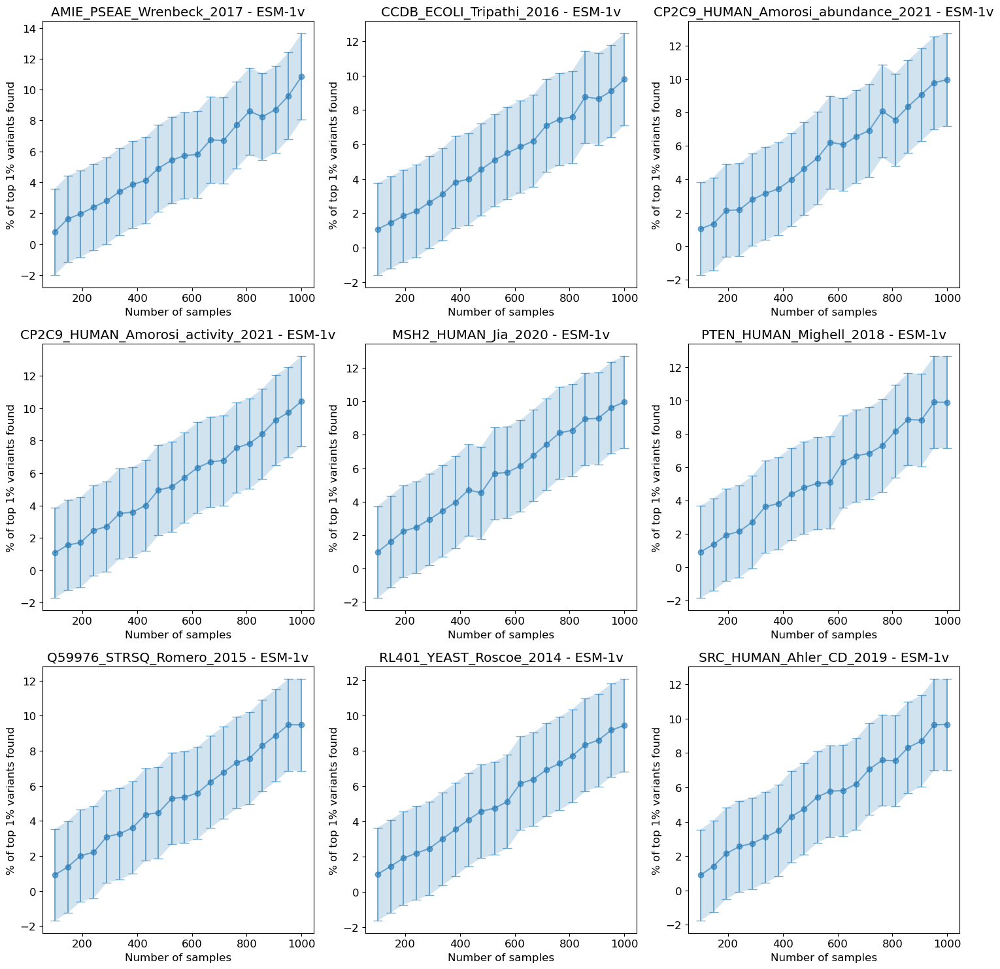

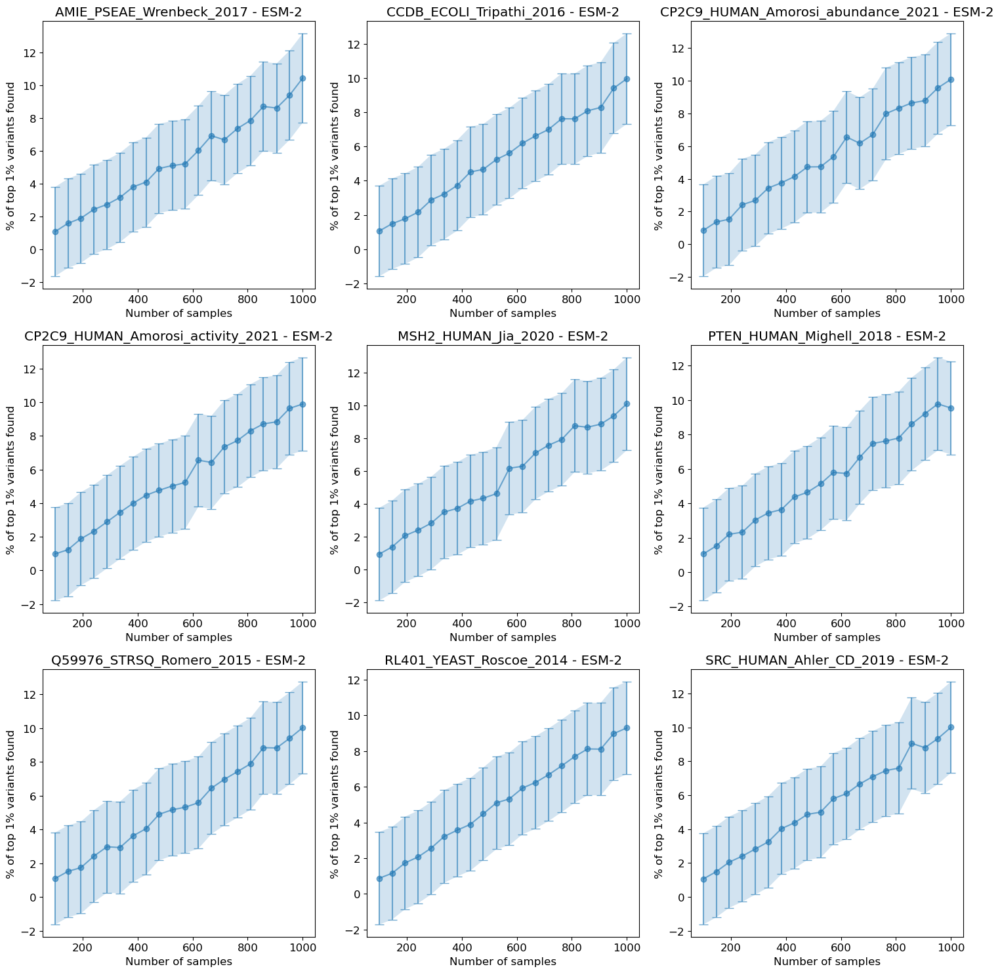

In [366]:
import matplotlib.pyplot as plt
import numpy as np

# Define maximum number of columns
max_cols = 3

# Define range of number of samples
num_samples_range = np.linspace(100, 5000, 20, dtype=int)  # Adjust as needed

# Filter top_mutations_data by model
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]

    # Calculate the number of rows and columns for the grid
    num_plots = len(filtered_data)
    num_rows = num_plots // max_cols
    num_rows += num_plots % max_cols

    # Create the subplots
    fig = plt.figure(figsize=(max_cols*5, num_rows*5))
    axes = [fig.add_subplot(num_rows, max_cols, i+1) for i in range(num_plots)]

    # Iterate over datasets
    for i, data in enumerate(filtered_data):
        ax = axes[i]

        # Plot the random sampling effect
        plot_random_sampling_effect(ax, data, num_samples_range)

        ax.set_title(f'{data["study"]} - {model.replace("esm", "ESM-")}')
        ax.set_xlabel('Number of samples')
        ax.set_ylabel('% of top 1% variants found')

    plt.tight_layout()
    plt.savefig(f'results/random_sampling_{model}.png')
    plt.show()


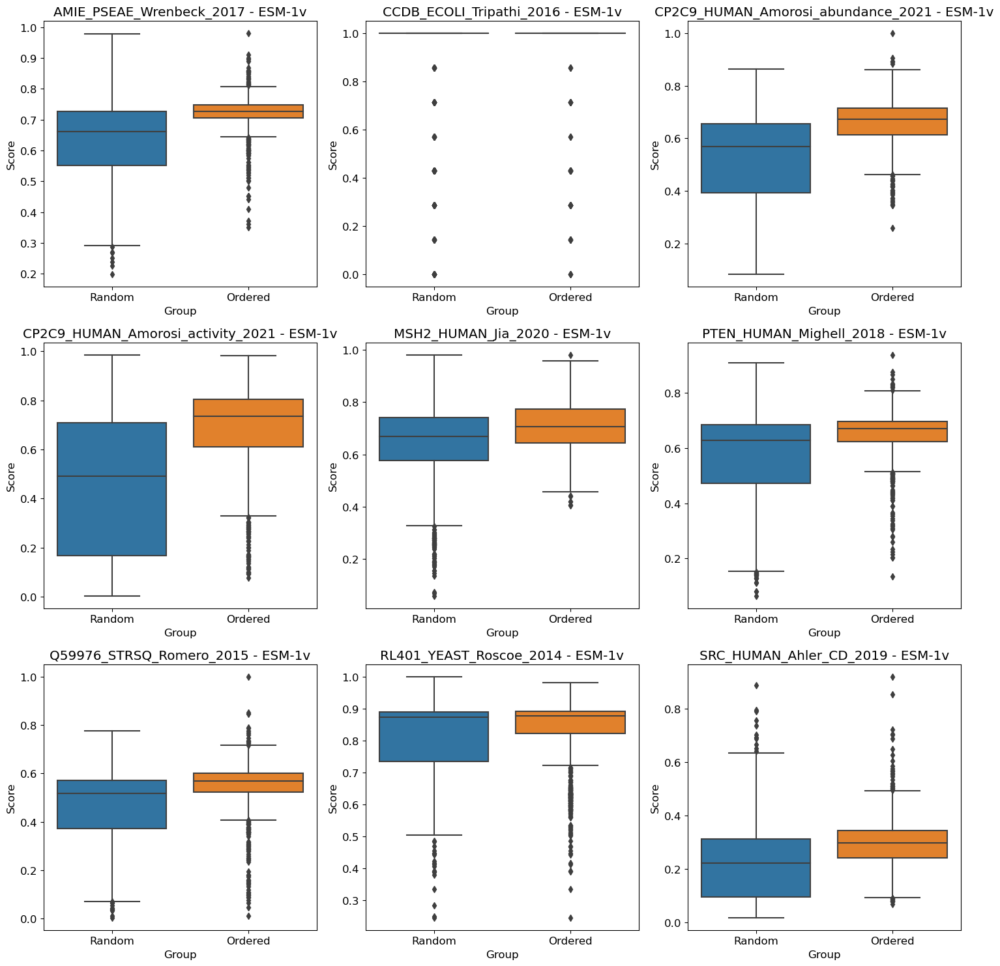

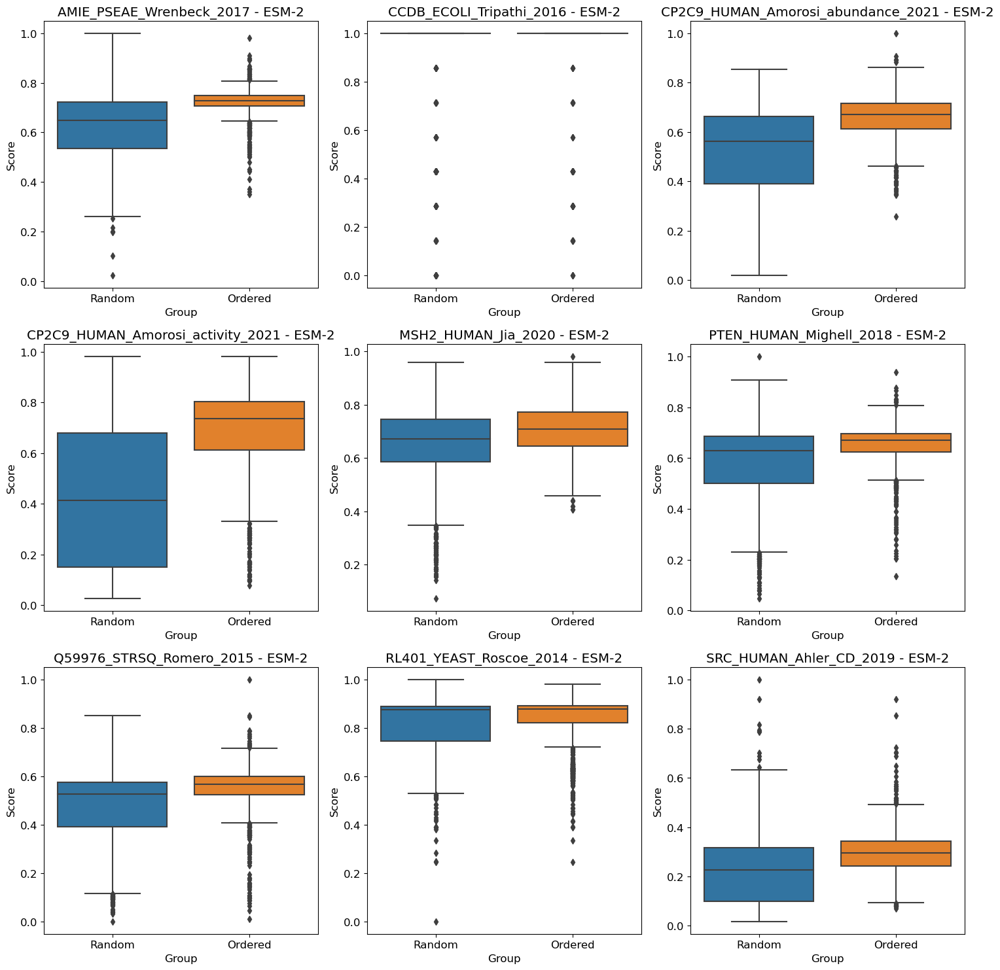

In [360]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Define maximum number of columns
max_cols = 3

# Define parameters
N_sample = 1000

# Filter top_mutations_data by model
models = ['esm1v', 'esm2']
for model in models:
    filtered_data = [data for data in top_mutations_data if data['model'] == model]

    # Calculate the number of rows and columns for the grid
    num_plots = len(filtered_data)
    num_rows = num_plots // max_cols
    num_rows += num_plots % max_cols

    # Create the subplots
    fig = plt.figure(figsize=(max_cols*5, num_rows*5))
    axes = [fig.add_subplot(num_rows, max_cols, i+1) for i in range(num_plots)]

    # Iterate over datasets
    for i, data in enumerate(filtered_data):
        ax = axes[i]
        
        # Sample N_sample points from data
        sampled_data = data['df'].sample(N_sample)['Score']
        
        # Get top N_sample points ordered by MMP score
        ordered_data = data['df'].sort_values('MMP', ascending=False)
        top_scores = ordered_data.head(N_sample)['Score']
        
        # Create a DataFrame for boxplot
        plot_data = pd.DataFrame({
            'Random': sampled_data,
            'Ordered': top_scores
        })

        # Create boxplot for the sampled data and top scores
        sns.boxplot(data=plot_data, ax=ax)
        ax.set_title(f'{data["study"]} - {model.replace("esm", "ESM-")}')
        ax.set_xlabel('Group')
        ax.set_ylabel('Score')

    plt.tight_layout()
    plt.savefig(f'results/boxplot_{model}.png')
    plt.show()
